# Debug our eigenvector based radiation mode normalization

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact, plot_complex, plot_complex_surface
from scipy.optimize import newton
plt.style.use('dark_background')
%matplotlib widget

In [2]:
A = SlabExact(scale=1e-5, Ts=[6.5, 1, 8, 2.5, 6.5],
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[100, 40, 300, 40, 100],
              symmetric=True, wl=6.9e-6)

## First check: is det of Q matrix equal to product of diagonal of transmission matrix (M)?

In [3]:
B = np.array([[0,1],[1,0]])

Z = np.array([1,2,3])
M = A.transmission_matrix(Z)
idxs = np.arange(len(M.shape))
idxs[[-2, -1]] = idxs[[-1, -2]]
Q = B + M.transpose(idxs) @ (B @ M)

In [50]:
def Q_matrix(Z):
    M = A.transmission_matrix(Z)
    idxs = np.arange(len(M.shape))
    idxs[[-2, -1]] = idxs[[-1, -2]]
    return B + M.transpose(idxs) @ (B @ M)

def detQ(Z):
    Q = Q_matrix(Z)
    return Q[..., 0, 0] * Q[...,1, 1] - Q[..., 0,1] * Q[...,1,0]

def prod_diag(Z):
    M = A.transmission_matrix(Z)
    return -4 * M[..., 0, 0] * M[...,1, 1]

def TrQ(Z):
    Q = Q_matrix(Z)
    return Q[..., 0, 0] + Q[...,1, 1]

def TrM(Z):
    M = A.transmission_matrix(Z)
    return (M[..., 1, 0] / M[..., 0, 0] )


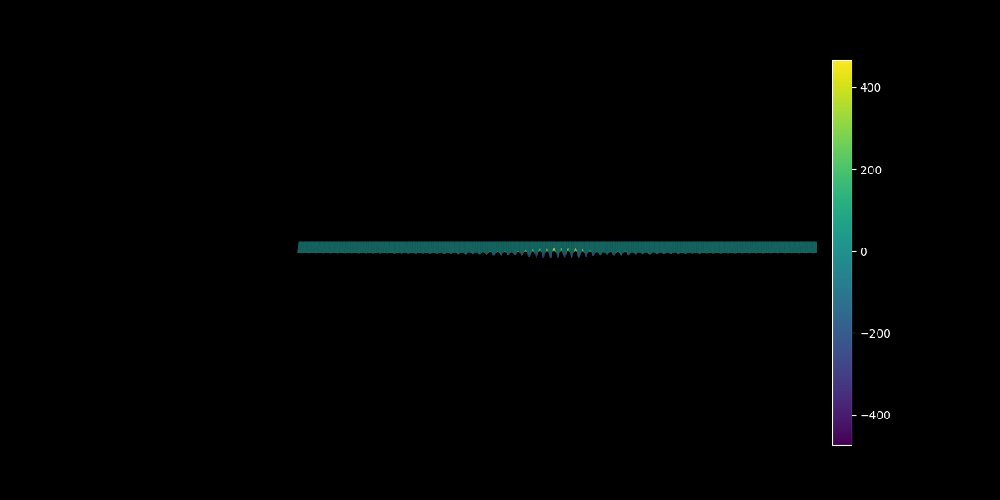

In [57]:
plot_complex_surface(TrM, -20, 20, -.6, .6, rref=400, iref=100, part='real')

# 

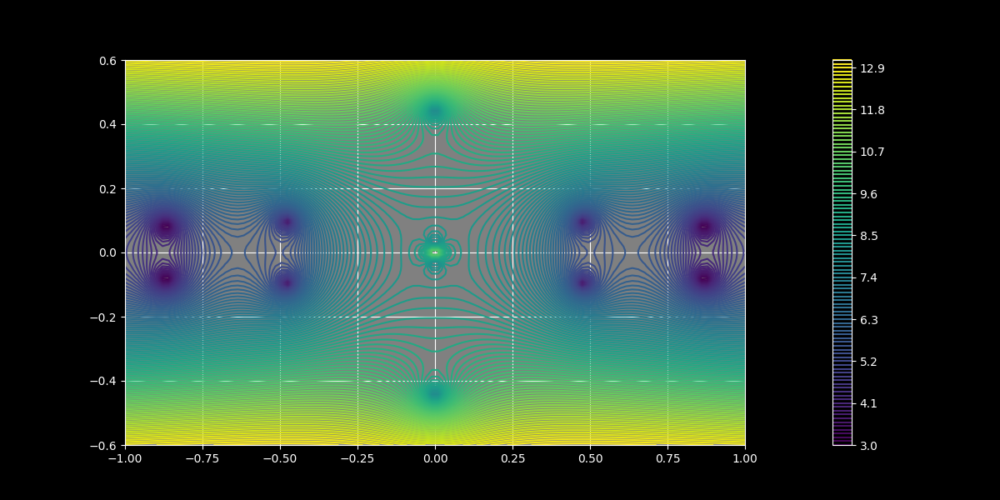

In [5]:
plot_complex(detQ, -1, 1, -.6, .6, iref=100, rref=100, levels=100)

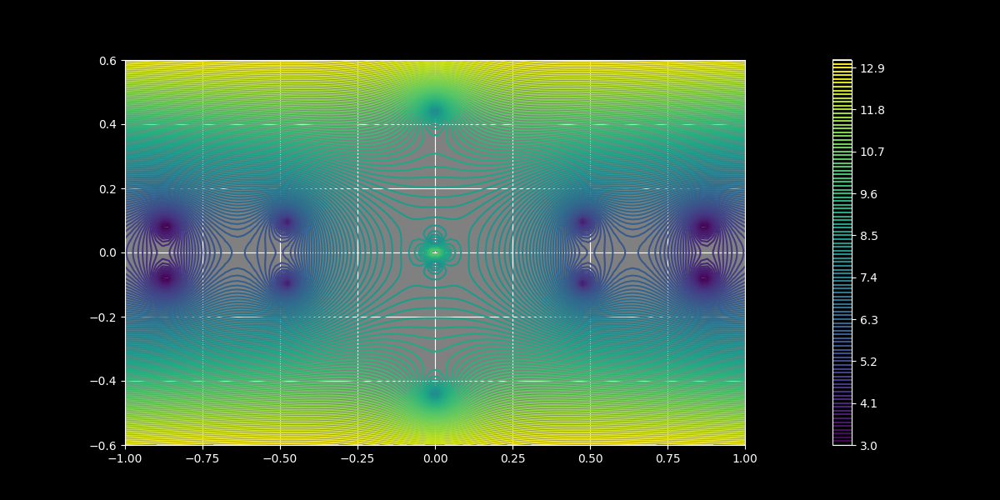

In [6]:
plot_complex(prod_diag, -1, 1, -.6, .6, iref=100, rref=100, levels=100)

We are good there.

## Second check: am I computing the eigvals correctly?

In [7]:
def Q_eigvals_numpy(Z):
    Q = Q_matrix(Z)
    vals = np.linalg.eig(Q)[0]
    return vals[..., 0] * vals[..., 1]

def Q_eigvecs_numpy(Z):
    Q = Q_matrix(Z)
    vecs = np.linalg.eig(Q)[1]
    vecs = vecs[...,0]**2 + vecs[...,1]**2
    return vecs[...,0] * vecs[...,1]

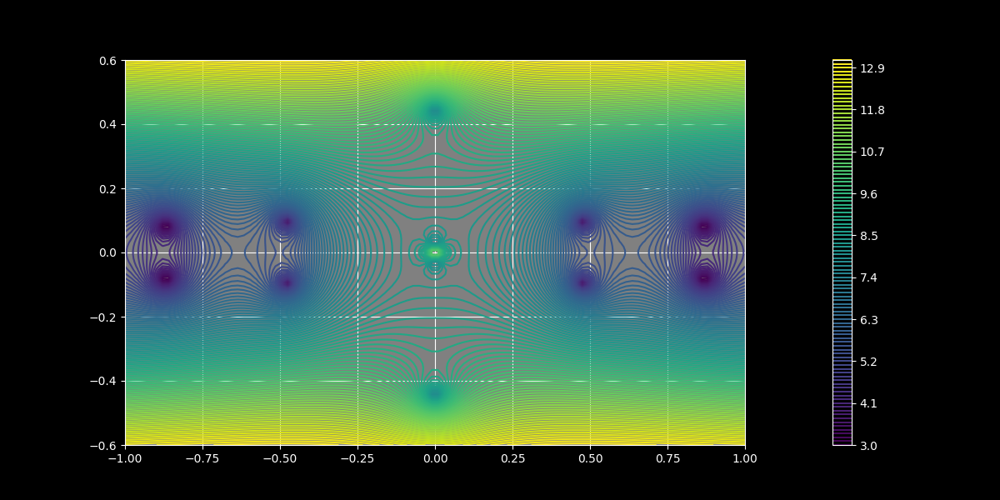

In [8]:
plot_complex(Q_eigvals_numpy, -1, 1, -.6, .6, rref=100, iref=100, levels=100)

Okay, the eigvals are zero at the leaky/guided mode propagation constant locations.

In [58]:
def Q_eigvals_us(Z):
    M = A.transmission_matrix(Z, Ztype_far_left='standard', Ztype_far_right='standard')
    
    trQs = M[..., 0, 0] * M[..., 1, 0] + \
        M[..., 0, 1] * M[..., 1, 1]
    
    disc = np.sqrt(trQs**2 + 4 * M[..., 0, 0] * M[..., 1, 1],
                        dtype=complex)
    Lp = trQs + disc
    Lm = trQs - disc
    return Lp * Lm

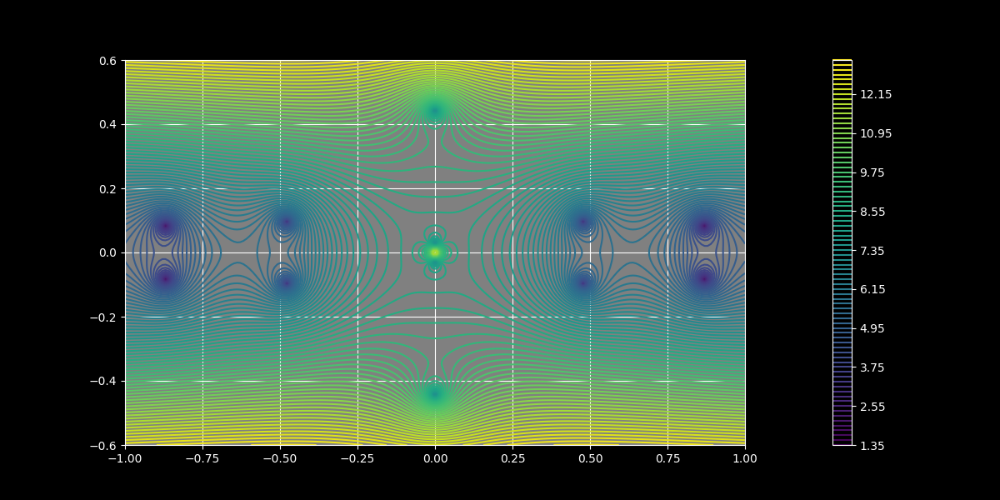

In [59]:
plot_complex(Q_eigvals_us, -1, 1, -.6,.6, rref=200, iref=200, levels=100)

It's now correct. Had an issue with not keeping a 4 in the discriminant when canceling a 2.  Before other checks, I'm going to grab some propagation constants

In [60]:
guesses = [
    .5-.1j,
    .8-.1j,
]
Zs = np.array([newton(A.determinant, np.array(guess))[0] for guess in guesses]).conj()
A.plot_points(Zs)

## Check 3: Are the non-conjugated dot products of the eigenvectors with themselves non-zero?

This is a late realization.  Since we're not conjugating, if $v$ is an eigenvector of $Q$, then $v^T Q v = \lambda v^T v$.  If $\lambda = 0$ we get a pole, but we could also get a pole if $v^T v = 0$ since $v$ may be complex valued and we're not conjugating.

In [144]:
def eigvec_dot(Z):
    M = A.transmission_matrix(Z, Ztype_far_left='standard', Ztype_far_right='standard', scaled=False)
    
    trQs = M[..., 0, 0] * M[..., 1, 0] + \
        M[..., 0, 1] * M[..., 1, 1]
    
    Lp = trQs + np.sqrt(trQs**2 + 4 * M[..., 0, 0] * M[..., 1, 1],
                        dtype=complex)
    Lm = trQs - np.sqrt(trQs**2 + 4 * M[..., 0, 0] * M[..., 1, 1],
                        dtype=complex)    
    C1 = 2 * M[..., 0, 0] * M[..., 1, 1]
    C2 = Lp - 2 * M[..., 0, 0] * M[..., 1, 0]
    C3 = Lm - 2 * M[..., 0, 0] * M[..., 1, 0]
    # return (Lm * (C1**2 + C3**2) / (Lp * (C1**2 + C2**2))) / ( - 4 * M[..., 0, 0] * M[..., 1, 1])
    return (C1**2 + C3**2) * (C1**2 + C2**2) / ( - 4 * M[..., 0, 0] * M[..., 1, 1])**2

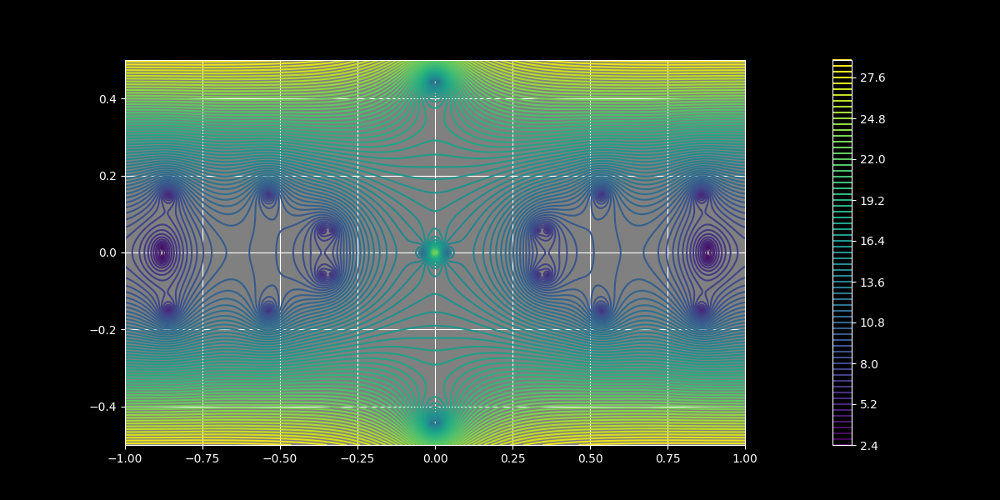

In [145]:
plot_complex(eigvec_dot, -1, 1, -.5, .5, rref=250, iref=250, levels=70)

In [137]:
A.plot_points(Zs)

Darn, it does look like there are some extra zeros, and these might cause unwanted poles in the integrand.  It also shows above that we have some zeros here that coincide with guided and leaky mode eigenvalues, which is sort of unfortunate as this was what we originally designed the eigvec normalization to avoid. Let's explore further

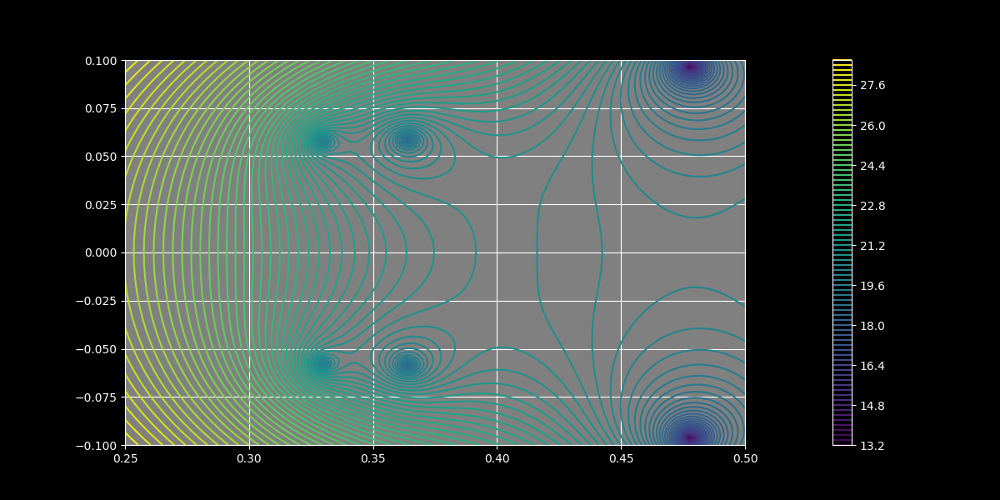

In [111]:
plot_complex(eigvec_dot, .25, .5, -.1, .1,  rref=100, iref=100, levels=100)

In [112]:
A.plot_points(Zs[:1])

In [113]:
dot_zero = newton(eigvec_dot, np.array(.365 - .065j), tol=1e-15)
eigvec_dot(dot_zero)
A.plot_points(dot_zero)

 Let's look at numpy's eigvecs

In [114]:
def Q_eigvecs_numpy(Z):
    Q = Q_matrix(Z)
    vecs = np.linalg.eig(Q)[1]
    vecs = vecs[...,0]**2 + vecs[...,1]**2
    return vecs[...,0] * vecs[...,1]

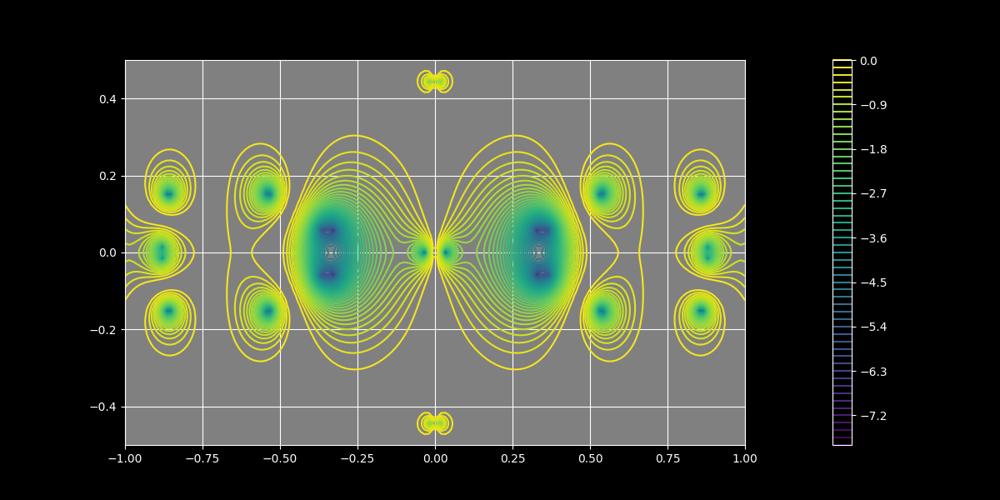

In [115]:
plot_complex(Q_eigvecs_numpy, -1,1, -.5, .5, rref=150, iref=150, levels=70)

In [116]:
A.plot_points(Zs)

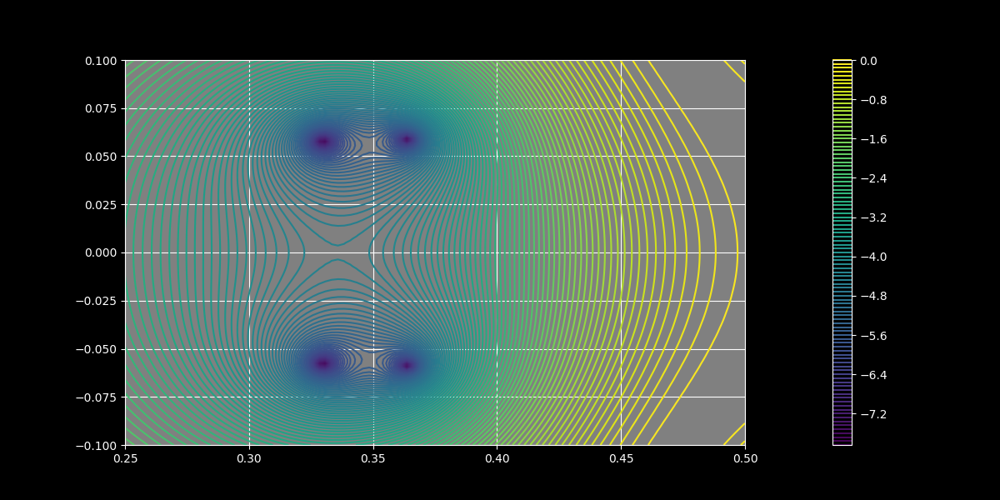

In [107]:
plot_complex(Q_eigvecs_numpy, .25, .5, -.1, .1,  rref=100, iref=100, levels=100)

In [108]:
# newton(Q_eigvecs_numpy, np.array(.32 + .6j))  # This one doesn't have good numerics for root finding, but ours does.

Numpy's eigvecs have some of the same zeros.  Although they don't seem to appear in the spectral integrand...

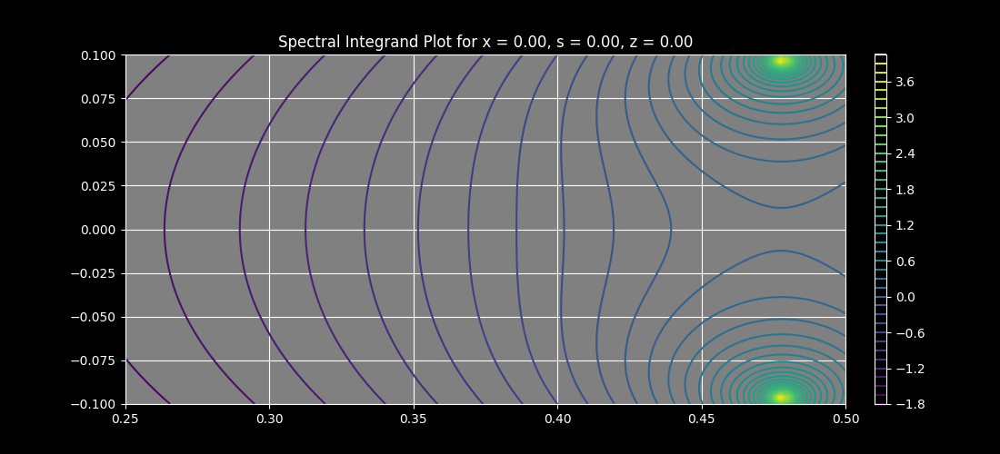

In [146]:
A.spectral_integrand_plot( .25, .5, -.1, .1, s=0, levels=50, iref=150, rref=100,
                          Normalizer=A.normalizer('eigvec'), z=0,
                          # part='real', log_abs=False, facecolor='k', grid=False,
                          # pad=.02, colorbar_aspect=30, colorbar_frac=.05,
                         )

It really seems like the expected poles don't appear... I'll go back to theory to see what's up.  Let's look at the numerator and denominator of the spectral integral (at $x=s=0$ for unshifted geometry) computed by hand.

In [3]:
def spect_int_by_hand(C, out='numerator'):
    try:
        len(C)
        C = np.asanyarray(C)
    except TypeError:
        C = np.asanyarray([C])
    A = SlabExact(scale=1e-5, Ts=[6.5, 1, 8, 2.5, 6.5],
          ns=[1, 1.44, 1, 1.44, 1], xrefs=[100, 40, 300, 40, 100],
          symmetric=False, wl=6.9e-6,Shift=8)
    M = A.transmission_matrix(C)

    trQs = M[..., 0, 0] * M[..., 1, 0] + \
        M[..., 0, 1] * M[..., 1, 1]
    
    disc = np.sqrt(trQs**2 + 4 * M[..., 0, 0] * M[..., 1, 1],
                   dtype=complex)
    
    L1 = trQs + disc
    L2 = trQs - disc

    A1 = 2 * M[..., 0, 0] * M[..., 1, 1]
    A2 = L1 - 2 * M[..., 0, 0] * M[..., 1, 0]

    B1 = 2 * M[..., 0, 0] * M[..., 1, 1]
    B2 = L2 - 2 * M[..., 0, 0] * M[..., 1, 0]

    # Num = L2 * (A1 + A2)**2 * (B1**2 + B2**2) + L1 * (B1 + B2) ** 2 * (A1**2 + A2**2)
    # Num = L2 * (A1 + A2)**2 /  (A1**2 + A2**2) + L1 * (B1 + B2) ** 2 /  (B1**2 + B2**2)
    # Num = L2 * (1 + (2*A1*A2 / (A1**2 + A2**2))) + L1 * (1 + (2*B1*B2 / (B1**2 + B2**2)))
    # I'm taking actual numerator (line 1 above) and dividing by (A1**2 + A2**2) * (B1**2 + B2**2)
    # I get to here exactly:
    Num = L1 + L2 + (2*A1 * A2 * L2/ (A1**2 + A2**2)) + (2*B1*B2 * L1  / (B1**2 + B2**2))
    # But then if I just drop the L1 + L2, I get what turns out to be equal to L1 * L2
    Num = ((2*A1 * A2 * L2/ (A1**2 + A2**2)) + (2*B1*B2 * L1  / (B1**2 + B2**2))) / (L1*L2)
    # Using this, we get that the true numerator divided by (A1**2 + A2**2) * (B1**2 + B2**2) is
    # equal to L1 + L2 + L1*L2
    # Num = (L1 + L2) + L1 * L2
    Denom = L1 * L2 * (A1**2 + A2**2) * (B1**2 + B2**2)

    Left = (A1 + A2)**2 / (L1 * (A1**2 + A2**2))
    Right = (B1 + B2)**2 / (L2 * (B1**2 + B2**2))
    if out == 'numerator':
        return Num 
        # return Num_leftover
    elif out == 'denominator':
        return Denom / ((A1**2 + A2**2) * (B1**2 + B2**2))**1
    else:
        return Num / Denom

In [4]:
spect_int_by_hand(2+.4j)

array([1.-1.44879566e-13j])

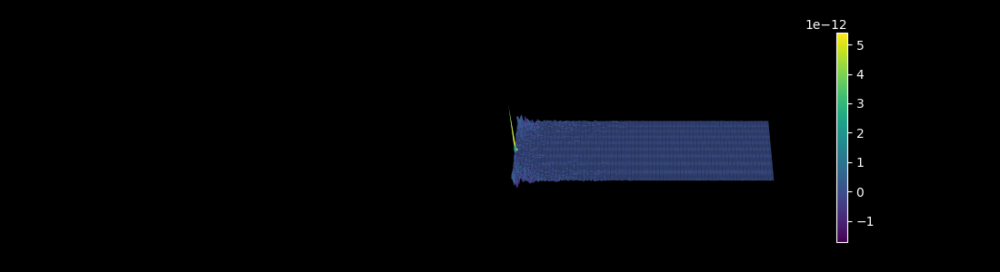

In [5]:
plot_complex_surface(spect_int_by_hand, 0, 2, -.3, .3,  figsize=(11,3),
             rref=150, iref=150, log_abs=True,
             # part='real', log_abs=False, facecolor='k', grid=False,
            )

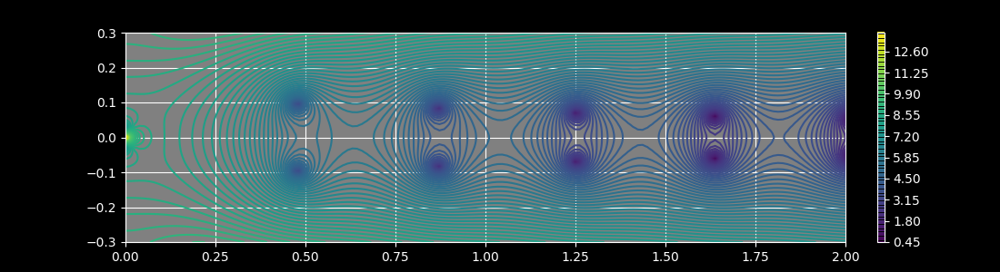

In [6]:
plot_complex(spect_int_by_hand, 0, 2, -.3, .3, fargs=('denominator',), figsize=(11,3),
             rref=150, iref=150, levels=100,
             # part='real', log_abs=False, facecolor='k', grid=False,
            )

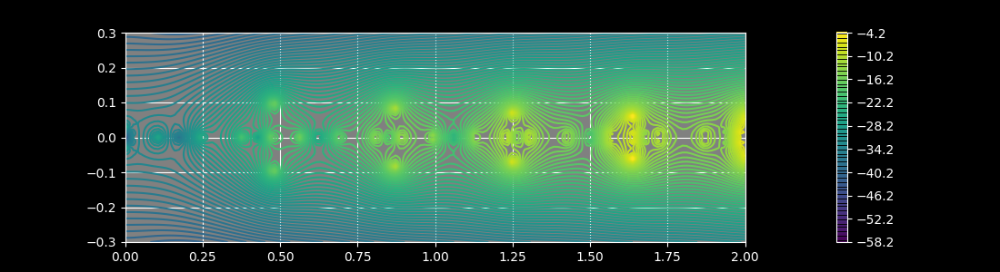

In [237]:
plot_complex(spect_int_by_hand, 0., 2, -.3, .3, fargs=('both',), rref=150, iref=150, levels=100, figsize=(11,3),
             # part='real', log_abs=False, facecolor='k', grid=False,
            )

The above is getting at a major part of things: the numerator has zeros of multiplicity 2 at the eigenvalues, but the denominator has zeros of multiplicity 3, yielding simple poles there.   After more investigation it seems possible that the numerator has a factor of $(v_1^T v_1)( v_2^T  v_2)$ in it.  If I can find this theoretically and cancel it things should be much simpler.

Further along and it seems like it does: the numerator seems to be $$ (\lambda_1 + \lambda_2 +  \lambda_1 \lambda_2) (v_1^T v_1)( v_2^T  v_2)$$  so that the total expression for the spectral integrand in this case after canceling terms from the denominator is  $$ \frac{\lambda_1 + \lambda_2}{\lambda_1 \lambda_2}+ 1$$  This won't be the formula in all cases, but I'd like to look at the spectral integrand after subtracting the left portion above.

In [17]:
def spect_int_minus_eigval_portion(C, x=0, s=0):
    try:
        len(C)
        C = np.asanyarray(C)
    except TypeError:
        C = np.asanyarray([C])
        
    A = SlabExact(scale=1e-5, Ts=[6.5, 1, 8, 2.5, 6.5],
          ns=[1, 1.44, 1, 1.44, 1], xrefs=[100, 40, 300, 40, 100],
          symmetric=True, wl=6.9e-6)
    
    M = A.transmission_matrix(C)

    trQs = M[..., 0, 0] * M[..., 1, 0] + \
        M[..., 0, 1] * M[..., 1, 1]
    
    disc = np.sqrt(trQs**2 + 4 * M[..., 0, 0] * M[..., 1, 1],
                   dtype=complex)
    
    L1 = trQs + disc
    L2 = trQs - disc
    
    A1 = 2 * M[..., 0, 0] * M[..., 1, 1]
    A2 = L1 - 2 * M[..., 0, 0] * M[..., 1, 0]

    B1 = 2 * M[..., 0, 0] * M[..., 1, 1]
    B2 = L2 - 2 * M[..., 0, 0] * M[..., 1, 0]
    
    SI = A.spectral_integrand(C, s=s, x=x, Normalizer=A.normalizer('eigvec'))
    
    return SI * (L1 * L2)

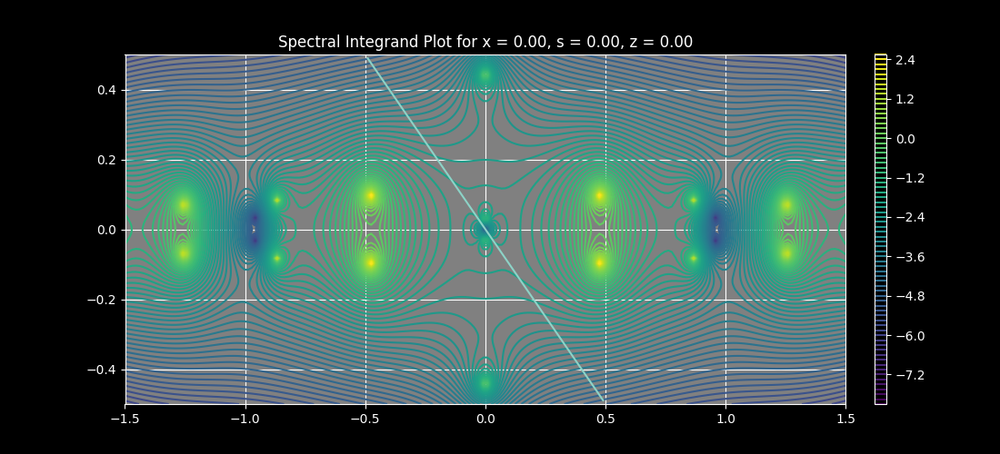

In [18]:
A.spectral_integrand_plot(-1.5,  1.5, -.5, .5, s=0, x=0, iref=200, rref=200, Normalizer=A.normalizer('eigvec'))

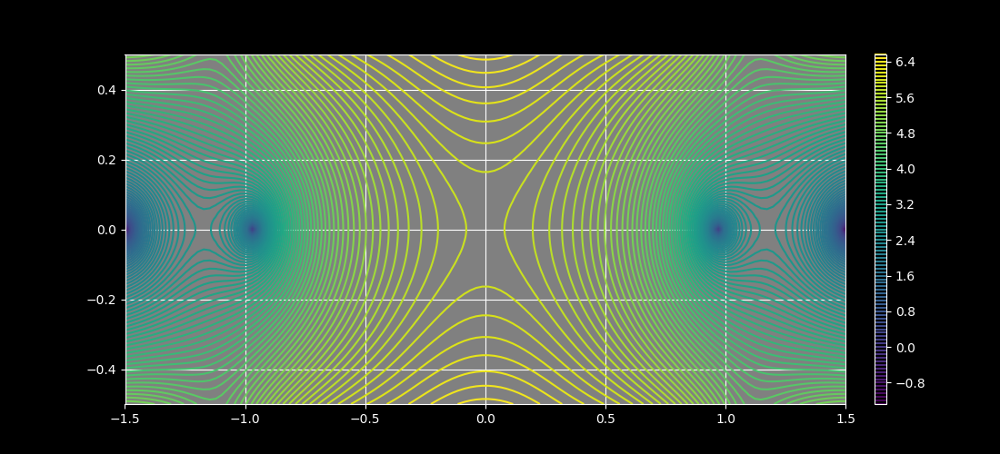

In [26]:
plot_complex(spect_int_minus_eigval_portion,-1.5,  1.5, -.5, .5, fargs=(1.2, 0), iref=120, rref=120, figsize=(11,5), levels=100)

Nah, it's not that simple.  But it is the case that the spectral integrand times L1 L2 does have no poles, so that does show that all the poles are simple and located at the eigenvalues. It also seems to show that the numerator again has a factor of $(v_1^T v_1)( v_2^T  v_2)$ in it, because otherwise we would likely get a pole at a non-eigenvalue location.  

It still remains to find the expression for the 

If I could analytically find the other zeros I could test out their multiplicities in a similar way, but the numerics aren't there right now... Actually they're better than I thought, my eigvec_dot function allows the netwon method to find a root.

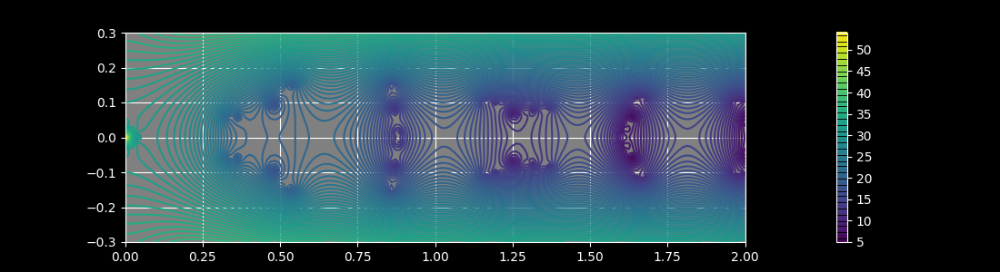

In [71]:
plot_complex(eigvec_dot, 0,  2, -.3, .3,figsize=(11,3),
             rref=150, iref=150, levels=100)

In [72]:
D0 = newton(eigvec_dot, np.array(.35 - .05j))
A.plot_points(D0, color='C0', ms=3)

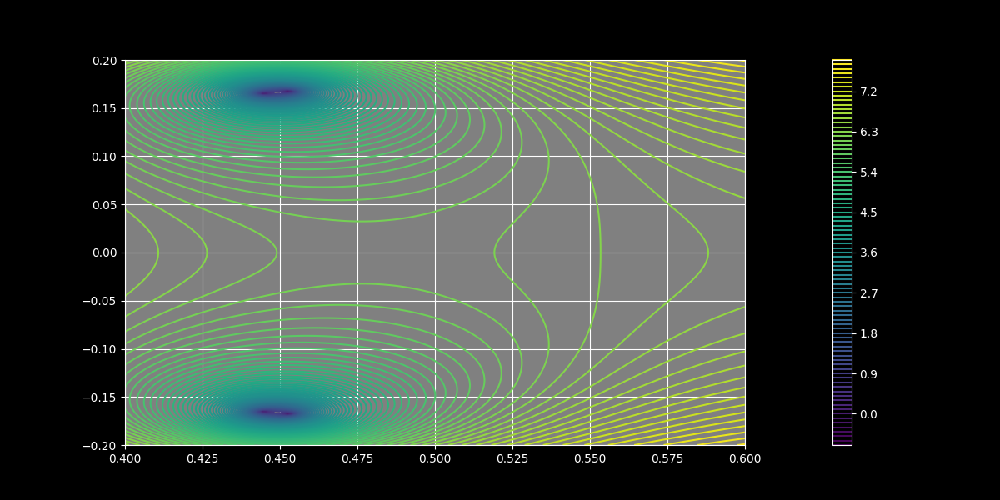

In [77]:
plot_complex(spect_int_by_hand, .4, .6, -.2, .2, fargs=('numerator',), rref=150, iref=150, levels=100,
            )

In [78]:
Z00 = newton(A.determinant, np.array(.5+.1j), args=('leaky',))[0]
Zr, Zi = Z00.real, Z00.imag
A.plot_points(Z00, c='r')

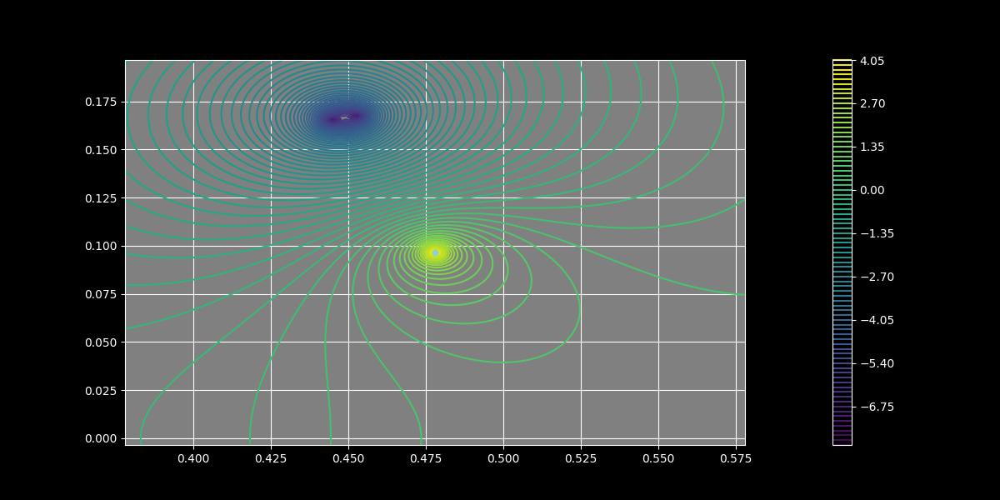

In [157]:
d = .1
plot_complex(spect_int_by_hand, Zr-d, Zr+d, Zi-d, Zi+d, rref=150, iref=150, levels=100)
A.plot_points(Z00)

Maybe the above is a singularity but not a pole

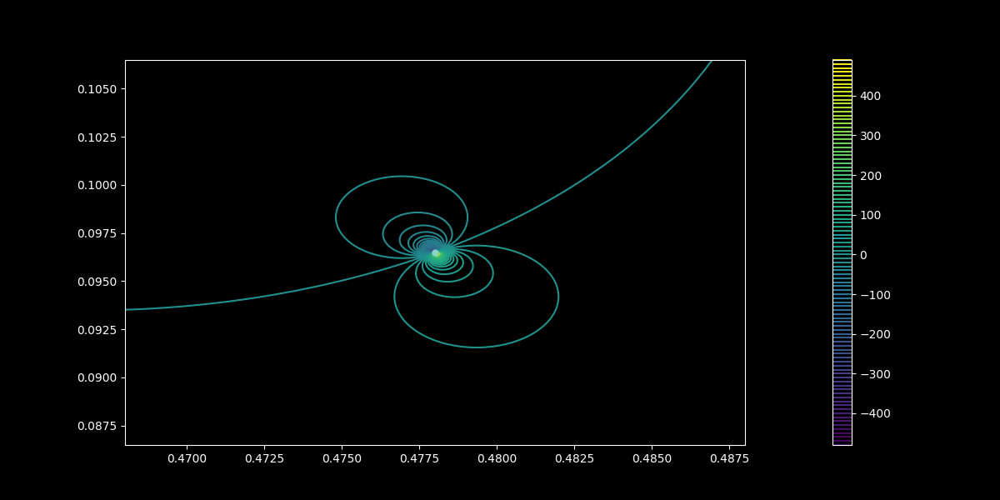

In [158]:
d = .01
plot_complex(spect_int_by_hand, Zr-d, Zr+d, Zi-d, Zi+d, rref=150, iref=150, levels=100,
            log_abs=False, part='real', facecolor='k', grid=False,
            )
A.plot_points(Z00)

No that looks like a simple pole... We could check integral

In [184]:
A = SlabExact(scale=1e-5, Ts=[6.5, 1, 8, 2.5, 6.5],
      ns=[1, 1.44, 1, 1.44, 1], xrefs=[100, 40, 300, 40, 100],
      symmetric=True, wl=6.9e-6)

In [185]:
Propagator_Class = A.propagator()
Eig = A.normalizer('eigvec')

In [211]:
P_leaky=[
    Propagator_Class(A.circular_contour(Z00, .01, 16, 'ccw'), 
                     exact_transform=A.delta_transform, exact_kwargs={'s':0, 'sign':1, 'Normalizer':Eig},
                     sign=1, Normalizer=Eig),
    Propagator_Class(A.circular_contour(Z00, .01, 16, 'ccw'), 
                     exact_transform=A.delta_transform, exact_kwargs={'s':0, 'sign':-1, 'Normalizer':Eig},
                     sign=-1, Normalizer=Eig)
]

In [212]:
leaky = lambda x: sum([P.slice_propagate(x) for P in P_leaky])

(<Figure size 1200x500 with 1 Axes>, <Axes: >)

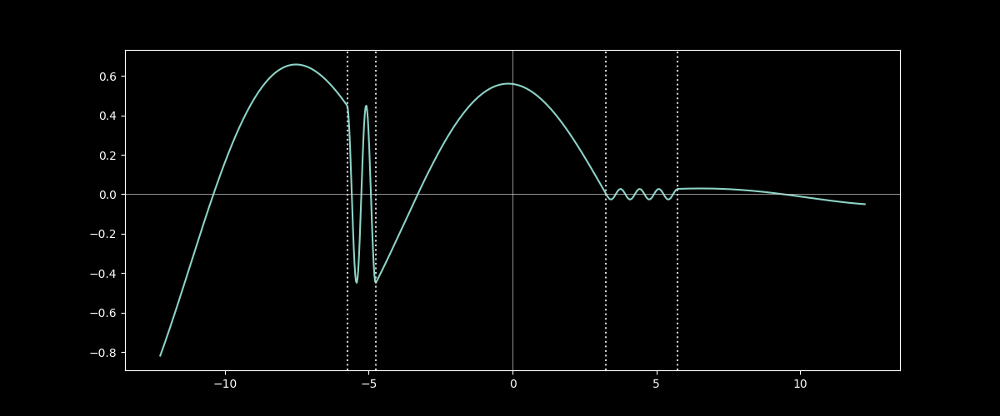

In [213]:
A.plot_field_1d(leaky)